## Script to import bridge data, calculate priorities and plot priorities

Script imports data from csv files, converts them to dataframes, and calculates priorities.

In [71]:
# Import dependencies

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import seaborn as sns
import cartopy.crs as ccrs
from cartopy.io.img_tiles import OSM, MapQuestOpenAerial, GoogleTiles
from cartopy.io.shapereader import Reader
import cartopy.feature as cfeature
sns.set()


#### Import data from csv files.

Data is not complete in either csv so both csv files are imported and merged together for complete info for all bridges.

In [72]:
Central = pd.read_csv('Assessment centralisation.csv')
Confirm = pd.read_csv('Bridge Stock Data .csv')
Material = pd.read_csv('Defects all.csv')
Daves = pd.read_csv('Current Assessment List DH Master.csv')
# Google = pd.read_csv('Google Import.csv')

In [73]:
Central.head()

,feature_id,site_code,plot_number,Structure No,Name,Structure Type,Status,Carries,Crosses,Maintaining Agent,critical_bci,length,carries
0,ST0001,12402489,3003541.0,1,BAYFORD,S:Culvert,Live,U191,Bayford Brook,HERTFORDSHIRE (STR),0.0,1.22,U191
1,ST0002,12410645,3002415.0,2,BAYFORDBURY,S:River Bridge,Live,B158,Bayford Brook,HERTFORDSHIRE (STR),100.0,4.27,B158
2,ST0003,12425143,3001815.0,3,BALLS PARK CULVERT,S:Culvert,Live,A414,Un-named Watercourse,HERTFORDSHIRE (STR),100.0,0.99,A414
3,ST0004,12425181,3001704.0,4,BEDWELL CULVERT,S:Culvert,Live,C55,Un-named Watercourse,HERTFORDSHIRE (STR),100.0,1.91,C55
4,ST0005,17225251,3001593.0,5,CATHARINE FARM,S:Pipe (Small Span Structure),Live,C84,Catherine Bourne,HERTFORDSHIRE (STR),100.0,0.76,C84


Merge dataframes to create new dataframe named 'Merged'.

In [74]:
Merged = Confirm.merge(Central, how = 'left', on = ['feature_id'])

In [75]:
Material['feature_id'] = Material['feature_id'].map(lambda x: x[:-3])

In [76]:
Material.head(100)

,site_code,plot_number,feature_id,feature_insp_date,observe_type_code,observe_type_name,grade_code,defect_date,defect_type,defect_type_name,defect_description,estimated_cost,primary_deck_element,prim_deck_elem_material,secondary_deck_element,sec_deck_elem_material,s_rw_material_type,s_rw_structural_form,s_sg_material_type,s_sg_structural_form
0,12402489,3003541.01,ST0001,20/09/2018 11:27,BE01,01/Primary Deck Element,3D,20/09/2018 10:39,0305,M/BW/MC-Cracks/Spalling,The arch had circumferential cracking at vario...,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
1,12402489,3003541.01,ST0001,20/09/2018 11:27,BE05,05/Tie beam/rod,3E,20/09/2018 10:40,0101,METALWORK-Rust/Pitts/Corrosion,Tie rod pattress plates are pitted with corros...,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
2,12402489,3003541.01,ST0001,20/09/2018 11:27,BE08,08/Foundations,1A,NaN,NaN,NaN,NaN,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
3,12402489,3003541.01,ST0001,20/09/2018 11:27,BE09,09/Abutments(inc.arch spring),2D,20/09/2018 10:42,0307,M/BW/MC-Bulg/Lean/Displacement,Area of minor bulging noted to the north abutm...,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
4,12402489,3003541.01,ST0001,20/09/2018 11:27,BE09,09/Abutments(inc.arch spring),2D,20/09/2018 11:00,0305,M/BW/MC-Cracks/Spalling,2B Localised spall to the faces of the brickwork.,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
5,12402489,3003541.01,ST0001,20/09/2018 11:27,BE10,10/Spandrel wall/head wall,1A,NaN,NaN,NaN,NaN,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
6,12402489,3003541.01,ST0001,20/09/2018 11:27,BE17,17/Waterproofing,2E,20/09/2018 11:06,1402,WATERPROOFING-Stain/Struct.Dam,Ongoing seepage is evident as the soffit is al...,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
7,12402489,3003541.01,ST0001,20/09/2018 11:27,BE23,23/Handrail/parapet/saf.fences,3B,20/09/2018 11:09,0305,M/BW/MC-Cracks/Spalling,Vertical cracking in the parapet due to histor...,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
8,12402489,3003541.01,ST0001,20/09/2018 11:27,BE23,23/Handrail/parapet/saf.fences,3B,20/09/2018 11:11,0302,M/BW/MC-Pointing Deterioration,3B - Mortar loss in the parapet horizontal bri...,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN
9,12402489,3003541.01,ST0001,20/09/2018 11:27,BE23,23/Handrail/parapet/saf.fences,3B,20/09/2018 11:12,0305,M/BW/MC-Cracks/Spalling,3B - Spalling in the parapet walls.,NaN,13/Culv/Pipe/Subway- Circ/Oval,K/Masonry- Brick,20/No Sec Deck/No TransvBeam,P/No Sec Element - No Material,NaN,NaN,NaN,NaN


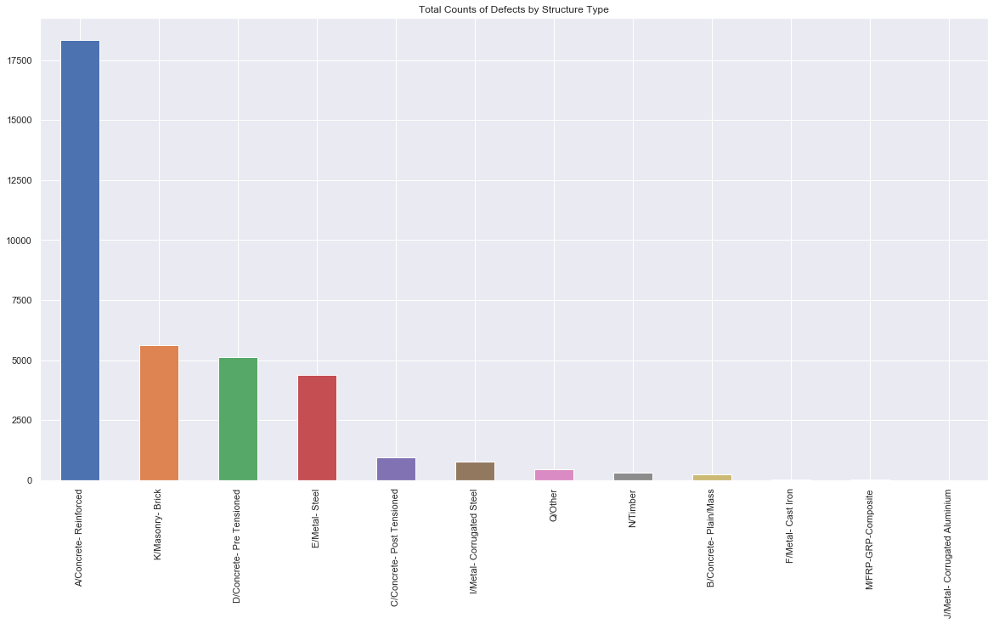

In [77]:
plt.rcParams['figure.figsize'] = [20, 10]
Material['prim_deck_elem_material'].value_counts().plot.bar(title='Total Counts of Defects by Structure Type')

In [167]:
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected=True)

In [170]:
data = [go.Bar(
            x=Material['prim_deck_elem_material'].value_counts().index,
            y=Material['prim_deck_elem_material'].value_counts(),
            textposition = 'auto',
             marker={
                'color': [1,2,3,4,5,6,7,8,9,10,11,12],
                'colorscale': 'Jet'}
    )]

layout = go.Layout(
    title='Total Counts of Defects by Structure Type')

fig = go.Figure(data=data, layout=layout)
plot(fig, filename='plt_Defect struc type.html')
iplot(fig)

In [171]:
labels = Material['prim_deck_elem_material'].value_counts().index
values = Material['prim_deck_elem_material'].value_counts()

# trace = go.Pie(labels=labels, values=values)

# layout = go.Layout(
#     title='Total Counts of Defects by Structure Type')

fig = {
  "data": [
    {
      "values": values,
      "labels": labels,
      "hoverinfo":"label+percent+value",
      "type": "pie"
    }],
    "layout": {
        "title":'Total Counts of Defects by Structure Type'}}

iplot(fig)
plot(fig, filename='plt_pie defect struc type.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_pie defect struc type.html'

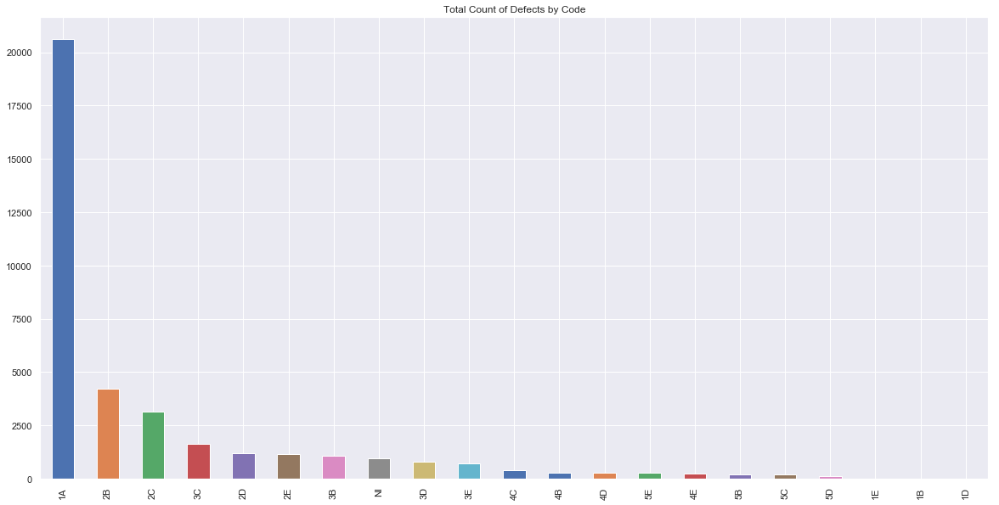

In [81]:
Material['grade_code'].value_counts().plot.bar(title='Total Count of Defects by Code')

In [172]:
data = [go.Bar(
            x=Material['grade_code'].value_counts().index,
            y=Material['grade_code'].value_counts(),
            textposition = 'auto',
             marker={
                'color': [i for i in range(21)],
                'colorscale': 'Jet'}
    )]

layout = go.Layout(
    title='Total Count of Defects by Code')

fig = go.Figure(data=data, layout=layout)
iplot(fig)
plot(fig, filename='plt_Defect by code.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_Defect by code.html'

In [83]:
mat_dict = {}

for i, struc in enumerate(Material['feature_id']):
    if struc in mat_dict:
        pass
    mat_dict[struc] = Material['prim_deck_elem_material'][i]


In [84]:
mat_count = pd.DataFrame(list(mat_dict.items()),
                      columns=['structure', 'material'])

In [85]:
per_struc = {}

for mat, struc in Material['prim_deck_elem_material'].value_counts().items():
    total = Material['prim_deck_elem_material'].value_counts()[mat]
    per = mat_count['material'].value_counts()[mat]
    per_struc[mat] = total / per

In [86]:
per_struc_df = pd.DataFrame(list(per_struc.items()),
                      columns=['material', 'per structure'])


In [87]:
per_struc_df.sort_values(by=['per structure'], inplace=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text xticklabel objects>)

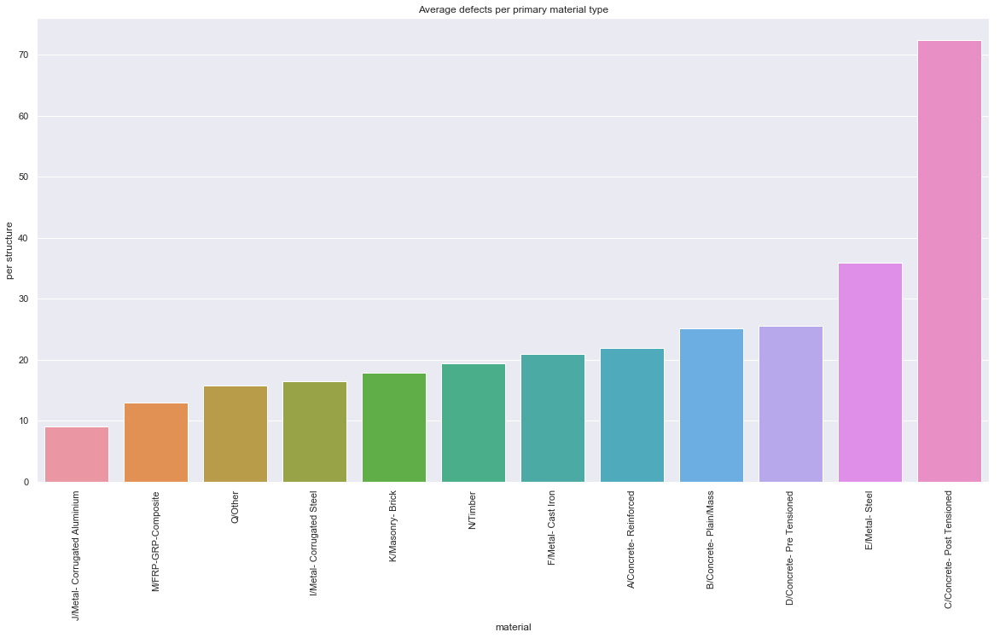

In [88]:
sns.barplot(x='material', y='per structure', data=per_struc_df)
plt.title('Average defects per primary material type')
plt.xticks(rotation=90)

In [173]:
data = [go.Bar(
            x=per_struc_df['material'],
            y=per_struc_df['per structure'],
            textposition = 'auto',
             marker={
                'color': [i for i in range(12)],
                'colorscale': 'Jet'}
    )]

layout = go.Layout(
    title='Average defects per primary material type')

fig = go.Figure(data=data, layout=layout)
iplot(fig)
plot(fig, filename='plt_Ave defect material.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_Ave defect material.html'

Keep only the columns we want and delete other columns with info we aren't after.

In [90]:
Cols_to_keep = ['feature_id', 'Name_x', 'Structure Type_x', 'Status_x', 'Easting',
                'Northing', 'Maintaining Agent_x', 'Construction Year', 'Hertitage',
                'critical_bci_x', 'length', 'carries', 'Crosses_x']

In [91]:
Merged = Merged[Cols_to_keep]

Tidy up column names

In [92]:
Cols_tidy = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting',
                'Northing', 'Maintaining Agent', 'Construction Year', 'Hertitage',
                'critical_bci', 'length', 'Carries', 'Crosses']

In [93]:
Merged.columns = Cols_tidy

In [94]:
Merged['Material'] = Merged['feature_id'].map(mat_dict)

In [95]:
Merged = Merged.merge(Daves[['feature_id', 'HCC Assessment Required?', 'Historic Capacity', 'Assessment Found?',
                             'Assessment Date']], how = 'left', on = ['feature_id'])

In [99]:
Merged[['Assessment Found?']] = Merged[['Assessment Found?']].fillna(value='N')

#### Assign a length score to each bridge based on its length

In [111]:
Merged['Length Score'] = np.where(Merged['length'] <= 20, 2, 0)
Merged['Length Score'] = np.where(Merged['length'] > 20, 3, Merged['Length Score'])
Merged['Length Score'] = np.where(Merged['length'] >= 50, 4, Merged['Length Score'])
Merged['Length Score'] = np.where(Merged['length'] > 200, 5, Merged['Length Score'])

In [112]:
Merged.head()

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,length,Carries,Crosses,Material,HCC Assessment Required?,Historic Capacity,Assessment Found?,Assessment Date,Length Score
0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.0,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,1.22,U191,Bayford Brook,K/Masonry- Brick,Y,40T,Y,1991,2
1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.0,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,4.27,B158,Bayford Brook,A/Concrete- Reinforced,Y,40T,Y,1991,2
2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.0,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,0.99,A414,Un-named Watercourse,K/Masonry- Brick,N,NaN,N,NaN,2
3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.0,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,1.91,C55,Un-named Watercourse,A/Concrete- Reinforced,Y,7.5 T GVW,Y,2000,2
4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.0,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,0.76,C84,Catherine Bourne,A/Concrete- Reinforced,N,NaN,N,NaN,2


#### Assign scores to each bridge based on what it carries and what it crosses.

Assign a score of 5 to any structures with structure type 'S:Rail Bridge'.

Use regular expressions to find A10-99 roads, A100-999 roads, A1000-9999 roads, and B roads and assign score accordingly.

All other structures are assigned a score of 1.

In [113]:
Merged['Crosses Score'] = np.where(Merged['Structure Type'] == 'S:Rail Bridge', 5, 1)
Merged['Crosses Score'] = np.where(Merged['Crosses'].str.contains(pat = '^A[0-9]{2}', regex = True), 5, Merged['Crosses Score'])
Merged['Crosses Score'] = np.where(Merged['Crosses'].str.contains(pat = '^A[0-9]{3}', regex = True), 4, Merged['Crosses Score'])
Merged['Crosses Score'] = np.where(Merged['Crosses'].str.contains(pat = '^A[0-9]{4}', regex = True), 3, Merged['Crosses Score'])
Merged['Crosses Score'] = np.where(Merged['Crosses'].str.contains(pat = '^B[0-9]', regex = True), 2, Merged['Crosses Score'])

In [114]:
Merged['Carries Score'] = np.where(Merged['Carries'].str.contains(pat = '^A[0-9]{2}', regex = True), 5, 1)
Merged['Carries Score'] = np.where(Merged['Carries'].str.contains(pat = '^A[0-9]{3}', regex = True), 4, Merged['Carries Score'])
Merged['Carries Score'] = np.where(Merged['Carries'].str.contains(pat = '^A[0-9]{4}', regex = True), 3, Merged['Carries Score'])
Merged['Carries Score'] = np.where(Merged['Carries'].str.contains(pat = '^B[0-9]', regex = True), 2, Merged['Carries Score'])

Check the columns and values again

In [115]:
Merged.head()

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,...,Carries,Crosses,Material,HCC Assessment Required?,Historic Capacity,Assessment Found?,Assessment Date,Length Score,Crosses Score,Carries Score
0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.0,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,...,U191,Bayford Brook,K/Masonry- Brick,Y,40T,Y,1991,2,1,1
1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.0,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,...,B158,Bayford Brook,A/Concrete- Reinforced,Y,40T,Y,1991,2,1,2
2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.0,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,...,A414,Un-named Watercourse,K/Masonry- Brick,N,NaN,N,NaN,2,1,4
3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.0,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,...,C55,Un-named Watercourse,A/Concrete- Reinforced,Y,7.5 T GVW,Y,2000,2,1,1
4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.0,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,...,C84,Catherine Bourne,A/Concrete- Reinforced,N,NaN,N,NaN,2,1,1


#### Assign a 'Route Score' to each structure as the max of the Carries and Crosses scores

In [116]:
Merged['Route Score'] = Merged[['Carries Score', 'Crosses Score']].max(axis=1)

Check columns and values

In [117]:
Merged.head()

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,...,Crosses,Material,HCC Assessment Required?,Historic Capacity,Assessment Found?,Assessment Date,Length Score,Crosses Score,Carries Score,Route Score
0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.0,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,...,Bayford Brook,K/Masonry- Brick,Y,40T,Y,1991,2,1,1,1
1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.0,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,...,Bayford Brook,A/Concrete- Reinforced,Y,40T,Y,1991,2,1,2,2
2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.0,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,...,Un-named Watercourse,K/Masonry- Brick,N,NaN,N,NaN,2,1,4,4
3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.0,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,...,Un-named Watercourse,A/Concrete- Reinforced,Y,7.5 T GVW,Y,2000,2,1,1,1
4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.0,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,...,Catherine Bourne,A/Concrete- Reinforced,N,NaN,N,NaN,2,1,1,1


#### Assign a 'BCI Score' to each structure based on their BCI value

In [118]:
Merged['BCI Score'] = np.where(Merged['critical_bci'] <= 40, 5, 5)
Merged['BCI Score'] = np.where(Merged['critical_bci'] > 40, 4, Merged['BCI Score'])
Merged['BCI Score'] = np.where(Merged['critical_bci'] > 65, 3, Merged['BCI Score'])
Merged['BCI Score'] = np.where(Merged['critical_bci'] > 80, 2, Merged['BCI Score'])
Merged['BCI Score'] = np.where(Merged['critical_bci'] > 90, 1, Merged['BCI Score'])

In [119]:
Merged.head(-5)

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,...,Material,HCC Assessment Required?,Historic Capacity,Assessment Found?,Assessment Date,Length Score,Crosses Score,Carries Score,Route Score,BCI Score
0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.00,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,...,K/Masonry- Brick,Y,40T,Y,1991,2,1,1,1,4
1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.00,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,...,A/Concrete- Reinforced,Y,40T,Y,1991,2,1,2,2,1
2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.00,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,...,K/Masonry- Brick,N,NaN,N,NaN,2,1,4,4,1
3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.00,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,...,A/Concrete- Reinforced,Y,7.5 T GVW,Y,2000,2,1,1,1,1
4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.00,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,...,A/Concrete- Reinforced,N,NaN,N,NaN,2,1,1,1,1
5,ST0006,BULLS MILL,S:River Bridge,Live,531428.0,215678.00,HERTFORDSHIRE (STR),01/01/1870,Not Present,100.00,...,D/Concrete- Pre Tensioned,N,17T,Y,1989,2,1,1,1,1
6,ST0007,COWBRIDGE,S:River Bridge,Live,532345.0,212803.00,HERTFORDSHIRE (STR),01/01/1935,Not Present,78.88,...,A/Concrete- Reinforced,Y,17.0 T GVW,Y,1994,2,1,2,2,3
7,ST0008,PANTHERS WOOD,S:Culvert,Live,527312.0,207063.00,HERTFORDSHIRE (STR),01/01/1978,Not Present,58.00,...,K/Masonry- Brick,N,NaN,N,NaN,2,1,2,2,4
8,ST0009,GOLDINGS SOUTH BRIDGE,S:River Bridge,Live,531408.0,213482.00,HERTFORDSHIRE (STR),01/01/1993,Present,100.00,...,D/Concrete- Pre Tensioned,N,NaN,N,NaN,2,1,4,4,1
9,ST0010,GOLDINGS CENTRAL BRIDGE,S:River Bridge,Live,531479.0,213732.00,HERTFORDSHIRE (STR),01/01/1869,Present,74.52,...,D/Concrete- Pre Tensioned,Y,40T,Y,NaN,2,1,4,4,3


In [120]:
Merged['Year'] = pd.to_datetime(Merged['Construction Year'], errors='coerce', infer_datetime_format=True)


In [121]:
Merged['Year'] = Merged['Year'].dt.year

In [122]:
Merged['Material'].unique()

array(['K/Masonry- Brick', 'A/Concrete- Reinforced',
       'D/Concrete- Pre Tensioned', nan, 'E/Metal- Steel',
       'I/Metal- Corrugated Steel', 'Q/Other', 'B/Concrete- Plain/Mass',
       'M/FRP-GRP-Composite', 'F/Metal- Cast Iron',
       'C/Concrete- Post Tensioned', 'N/Timber',
       'J/Metal- Corrugated Aluminium'], dtype=object)

In [123]:
Merged['Material Score'] = np.where(Merged['Material'] == 'K/Masonry- Brick', 1, 5)
Merged['Material Score'] = np.where(Merged['Material'] == ('A/Concrete- Reinforced' or 'D/Concrete- Pre Tensioned' or 'B/Concrete- Plain/Mass'), 2, Merged['Material Score'])
Merged.loc[(Merged['Material'].isin(['A/Concrete- Reinforced', 'D/Concrete- Pre Tensioned', 'B/Concrete- Plain/Mass'])) & (Merged['Year'] < 1950), ['Material Score']] = 5
Merged['Material Score'] = np.where(Merged['Material'] == ('E/Metal- Steel' or 'I/Metal- Corrugated Steel' or 'J/Metal- Corrugated Aluminium'), 2, Merged['Material Score'])
Merged.loc[(Merged['Material'].isin(['E/Metal- Steel', 'I/Metal- Corrugated Steel', 'J/Metal- Corrugated Aluminium'])) & (Merged['Year'] < 1930), ['Material Score']] = 5
Merged['Material Score'] = np.where(Merged['Material'] == 'C/Concrete- Post Tensioned', 4, Merged['Material Score'])

In [124]:
Merged.head()

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,...,Historic Capacity,Assessment Found?,Assessment Date,Length Score,Crosses Score,Carries Score,Route Score,BCI Score,Year,Material Score
0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.0,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,...,40T,Y,1991,2,1,1,1,4,1800.0,1
1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.0,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,...,40T,Y,1991,2,1,2,2,1,1972.0,2
2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.0,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,...,NaN,N,NaN,2,1,4,4,1,1973.0,1
3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.0,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,...,7.5 T GVW,Y,2000,2,1,1,1,1,1920.0,5
4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.0,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,...,NaN,N,NaN,2,1,1,1,1,1960.0,2


### Set the maximum importance for all minor structures (walls, gantries etc.) to be 10

First check the list of unique structure types

In [125]:
# List the unique structure types
Struc_uniq = Merged['Structure Type'].unique()
Struc_uniq

array(['S:Culvert', 'S:River Bridge', 'S:Pipe (Small Span Structure)',
       'S:Footbridge', 'S:Road Bridge', 'S:Rail Bridge', 'S:Subway',
       'S:Retaining Wall', 'S:Viaduct', 'S:Sign/Gantry', 'S:Other',
       'S:Underpass', 'S:Tunnel', 'S:Embankment'], dtype=object)

In [126]:
Limit_score = ['S:Pipe (Small Span Structure)', 'S:Retaining Wall', 'S:Sign/Gantry', 'S:Other','S:Embankment']

Select the structure types we want to limit to importance of 10 and save them in a list 'Limit_score'.

In [127]:
Merged['Importance'] = Merged['Length Score']*Merged['Route Score']

In [128]:
Merged['Severity'] = Merged['BCI Score']*Merged['Material Score']

Check the values of the minor structures and if they go beyond 10

In [129]:
Merged.loc[(Merged['Structure Type'].isin(Limit_score)), ['Importance']].describe()

,Importance
count,476.000000
mean,4.840336
std,4.945996
min,2.000000
25%,2.000000
50%,2.000000
75%,6.000000
max,25.000000


Select the cells where 'Structure Type' is in the Limit_score list AND the importance is greater than 10, then set those values to 10.

In [130]:
Merged.loc[(Merged['Structure Type'].isin(Limit_score)) & (Merged['Importance'] > 10), ['Importance']] = 10

Check the importance values of the minor structures

In [131]:
Merged.loc[(Merged['Structure Type'].isin(Limit_score)), ['Importance']].describe()

,Importance
count,476.000000
mean,4.054622
std,2.946034
min,2.000000
25%,2.000000
50%,2.000000
75%,6.000000
max,10.000000


As can be seen the maximum values have now been limited to 10

In [132]:
Merged['Critical'] = np.where(Merged['Importance'] >= 20, True, False)

In [133]:
Merged['Total Score'] = Merged['Importance'] * Merged['Severity']

In [134]:
Merged['Radius'] = 10*Merged['Importance']**1.5+100

Extract values from the dataframe we want to plot.

Importance is a score based on the length and route score of the structure.

Severity is the score based on BCI

## Merge the lat and long data from Google Import

In [135]:
# Extract the data we're interested in
East = Merged['Easting'].values
North = Merged['Northing'].values
Importance = Merged['Importance'].values
Severity = Merged['Severity'].values
Total_score = Merged['Total Score'].values
Names = Merged['feature_id'].values

As the data we have has eastings and northings and not latitudes and longitudes convert the eastings and northings

### Note although Bokeh says to convert to Mercator projection for map tiles, the actual projection is web-mercator, therefore use GOOGLE_MERCATOR

In [136]:
bridge_crs = ccrs.OSGB()
merc = ccrs.GOOGLE_MERCATOR
bridge_lat = []
bridge_lon = []
for es, nth in zip(East, North):
    x, y = merc.transform_point(es, nth, bridge_crs)
    bridge_lon.append(x)
    bridge_lat.append(y)


In [137]:
Merged['Latitude'] = bridge_lat
Merged['Longitude'] = bridge_lon
Merged.head()

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,...,BCI Score,Year,Material Score,Importance,Severity,Critical,Total Score,Radius,Latitude,Longitude
0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.0,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,...,4,1800.0,1,2,4,False,8,128.284271,6.755545e+06,-12837.313030
1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.0,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,...,1,1972.0,2,4,2,False,8,180.000000,6.761033e+06,-10475.044382
2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.0,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,...,1,1973.0,1,8,1,False,8,326.274170,6.762889e+06,-7086.686472
3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.0,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,...,1,1920.0,5,2,5,False,10,128.284271,6.755225e+06,-15417.910820
4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.0,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,...,1,1960.0,2,2,2,False,4,128.284271,6.744868e+06,-28937.250734


#### Save the dataframe to csv

In [138]:
Merged.to_csv('Bridges.csv')

Create function to scatter plot the bridges with colour based on 'Severity' and size based on 'Importance'

In [139]:
Merged.columns

Index(['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
       'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
       'length', 'Carries', 'Crosses', 'Material', 'HCC Assessment Required?',
       'Historic Capacity', 'Assessment Found?', 'Assessment Date',
       'Length Score', 'Crosses Score', 'Carries Score', 'Route Score',
       'BCI Score', 'Year', 'Material Score', 'Importance', 'Severity',
       'Critical', 'Total Score', 'Radius', 'Latitude', 'Longitude'],
      dtype='object')

In [55]:
Merged.set_index('feature_id')

,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,length,...,BCI Score,Year,Material Score,Importance,Severity,Critical,Total Score,Radius,Latitude,Longitude
feature_id,,,,,,,,,,,,,,,,,,,,,
ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.00,HERTFORDSHIRE (STR),01/01/1800,Not Present,50.32,1.22,...,4,1800.0,1,2,4,False,8,128.284271,6.755545e+06,-12837.313030
ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.00,HERTFORDSHIRE (STR),01/01/1972,Not Present,100.00,4.27,...,1,1972.0,2,4,2,False,8,180.000000,6.761033e+06,-10475.044382
ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.00,HERTFORDSHIRE (STR),01/01/1973,Not Present,100.00,0.99,...,1,1973.0,1,8,1,False,8,326.274170,6.762889e+06,-7086.686472
ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.00,HERTFORDSHIRE (STR),01/01/1920,Not Present,100.00,1.91,...,1,1920.0,5,2,5,False,10,128.284271,6.755225e+06,-15417.910820
ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.00,HERTFORDSHIRE (STR),01/01/1960,Not Present,100.00,0.76,...,1,1960.0,2,2,2,False,4,128.284271,6.744868e+06,-28937.250734
ST0006,BULLS MILL,S:River Bridge,Live,531428.0,215678.00,HERTFORDSHIRE (STR),01/01/1870,Not Present,100.00,7.10,...,1,NaN,5,2,5,False,10,128.284271,6.768414e+06,-10506.991953
ST0007,COWBRIDGE,S:River Bridge,Live,532345.0,212803.00,HERTFORDSHIRE (STR),01/01/1935,Not Present,78.88,9.47,...,3,1935.0,5,4,15,False,60,180.000000,6.763723e+06,-9148.831578
ST0008,PANTHERS WOOD,S:Culvert,Live,527312.0,207063.00,HERTFORDSHIRE (STR),01/01/1978,Not Present,58.00,1.22,...,4,1978.0,1,4,4,False,16,180.000000,6.754654e+06,-17503.076561
ST0009,GOLDINGS SOUTH BRIDGE,S:River Bridge,Live,531408.0,213482.00,HERTFORDSHIRE (STR),01/01/1993,Present,100.00,8.40,...,1,1993.0,5,8,5,False,40,326.274170,6.764861e+06,-10631.916671


In [56]:
Merged.reset_index()

,index,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,...,BCI Score,Year,Material Score,Importance,Severity,Critical,Total Score,Radius,Latitude,Longitude
0,0,ST0001,BAYFORD,S:Culvert,Live,530191.0,207688.00,HERTFORDSHIRE (STR),01/01/1800,Not Present,...,4,1800.0,1,2,4,False,8,128.284271,6.755545e+06,-12837.313030
1,1,ST0002,BAYFORDBURY,S:River Bridge,Live,531567.0,211119.00,HERTFORDSHIRE (STR),01/01/1972,Not Present,...,1,1972.0,2,4,2,False,8,180.000000,6.761033e+06,-10475.044382
2,2,ST0003,BALLS PARK CULVERT,S:Culvert,Live,533636.0,212321.00,HERTFORDSHIRE (STR),01/01/1973,Not Present,...,1,1973.0,1,8,1,False,8,326.274170,6.762889e+06,-7086.686472
3,3,ST0004,BEDWELL CULVERT,S:Culvert,Live,528596.0,207449.00,HERTFORDSHIRE (STR),01/01/1920,Not Present,...,1,1920.0,5,2,5,False,10,128.284271,6.755225e+06,-15417.910820
4,4,ST0005,CATHARINE FARM,S:Pipe (Small Span Structure),Live,520366.0,200833.00,HERTFORDSHIRE (STR),01/01/1960,Not Present,...,1,1960.0,2,2,2,False,4,128.284271,6.744868e+06,-28937.250734
5,5,ST0006,BULLS MILL,S:River Bridge,Live,531428.0,215678.00,HERTFORDSHIRE (STR),01/01/1870,Not Present,...,1,NaN,5,2,5,False,10,128.284271,6.768414e+06,-10506.991953
6,6,ST0007,COWBRIDGE,S:River Bridge,Live,532345.0,212803.00,HERTFORDSHIRE (STR),01/01/1935,Not Present,...,3,1935.0,5,4,15,False,60,180.000000,6.763723e+06,-9148.831578
7,7,ST0008,PANTHERS WOOD,S:Culvert,Live,527312.0,207063.00,HERTFORDSHIRE (STR),01/01/1978,Not Present,...,4,1978.0,1,4,4,False,16,180.000000,6.754654e+06,-17503.076561
8,8,ST0009,GOLDINGS SOUTH BRIDGE,S:River Bridge,Live,531408.0,213482.00,HERTFORDSHIRE (STR),01/01/1993,Present,...,1,1993.0,5,8,5,False,40,326.274170,6.764861e+06,-10631.916671
9,9,ST0010,GOLDINGS CENTRAL BRIDGE,S:River Bridge,Live,531479.0,213732.00,HERTFORDSHIRE (STR),01/01/1869,Present,...,3,1869.0,5,8,15,False,120,326.274170,6.765263e+06,-10506.806117


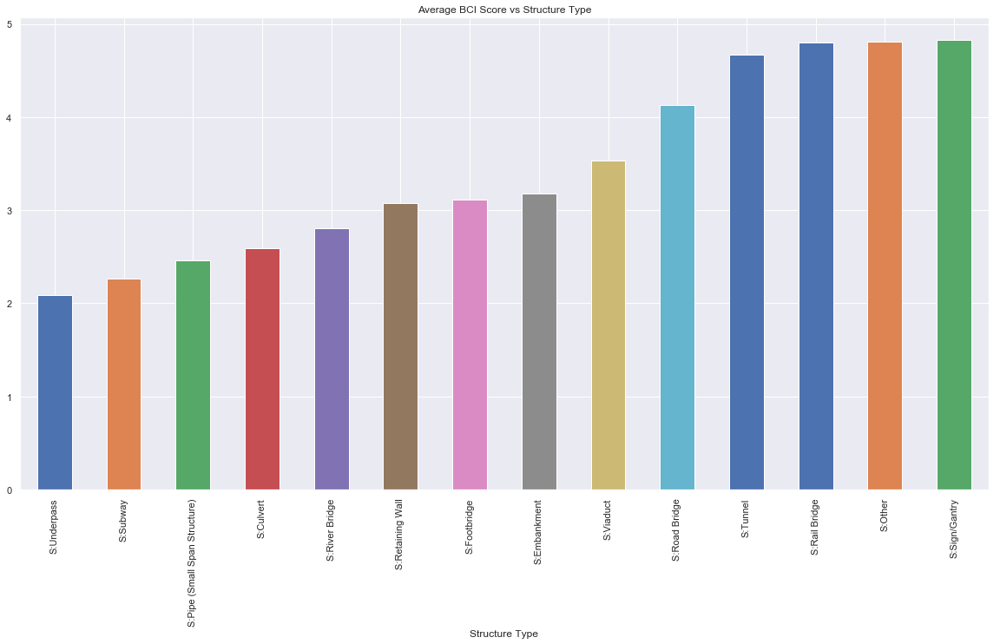

In [57]:
Merged[['Structure Type', 'BCI Score']].groupby(['Structure Type'])['BCI Score'].mean().sort_values().plot.bar(title='Average BCI Score vs Structure Type')

In [174]:
data = [go.Bar(
            x=Merged[['Structure Type', 'BCI Score']].groupby(['Structure Type'])['BCI Score'].mean().sort_values().index,
            y=Merged[['Structure Type', 'BCI Score']].groupby(['Structure Type'])['BCI Score'].mean().sort_values(),
            textposition = 'auto',
             marker={
                'color': Merged[['Structure Type', 'BCI Score']].groupby(['Structure Type'])['BCI Score'].mean().sort_values(),
                'colorscale': 'Jet'}
    )]

layout = go.Layout(
    title='Average BCI Score vs Structure Type')

fig = go.Figure(data=data, layout=layout)
iplot(fig)
plot(fig, filename='plt_Ave BCI by struc type.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_Ave BCI by struc type.html'

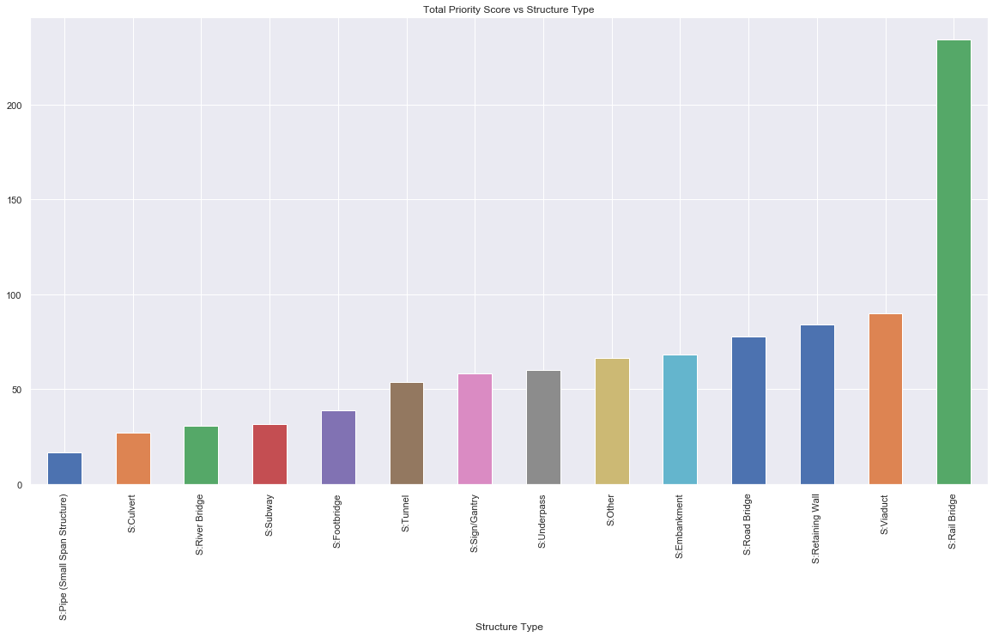

In [59]:
Merged[['Structure Type', 'Total Score']].groupby(['Structure Type'])['Total Score'].mean().sort_values().plot.bar(title='Total Priority Score vs Structure Type')

In [175]:
data = [go.Bar(
            x=Merged[['Structure Type', 'Total Score']].groupby(['Structure Type'])['Total Score'].mean().sort_values().index,
            y=Merged[['Structure Type', 'Total Score']].groupby(['Structure Type'])['Total Score'].mean().sort_values(),
            textposition = 'auto',
             marker={
                'color': Merged[['Structure Type', 'Total Score']].groupby(['Structure Type'])['Total Score'].mean().sort_values(),
                'colorscale': 'Jet'}
    )]

layout = go.Layout(
    title='Total Priority Score vs Structure Type')

fig = go.Figure(data=data, layout=layout)
iplot(fig)
plot(fig, filename='plt_Priority vs Struc type.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_Priority vs Struc type.html'

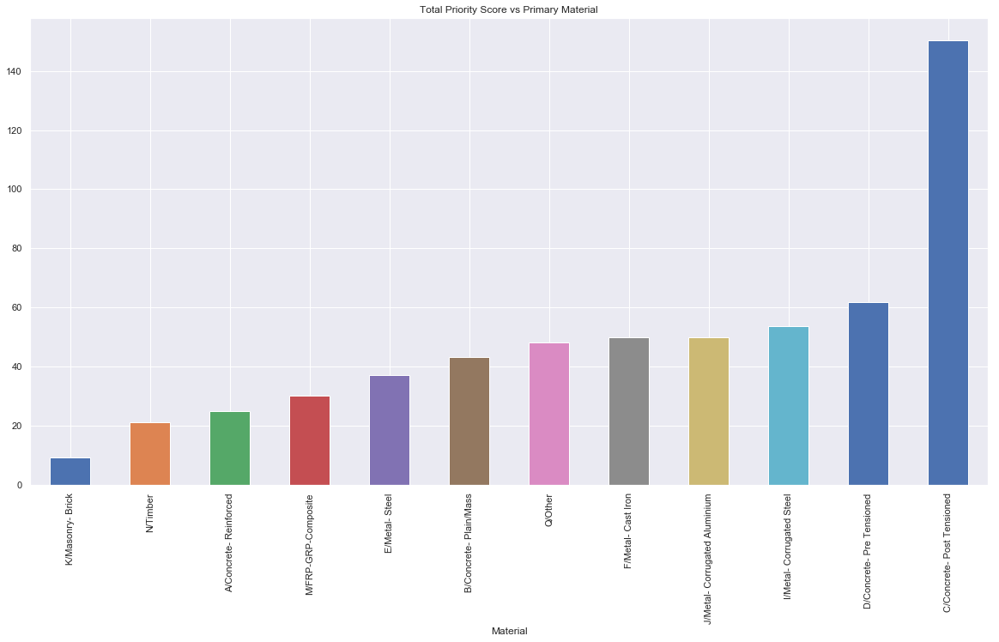

In [61]:
Merged[['Material', 'Total Score']].groupby(['Material'])['Total Score'].mean().sort_values().plot.bar(title='Total Priority Score vs Primary Material')

In [180]:
xs = Merged[['Material', 'Total Score']].groupby(['Material'])['Total Score'].mean().sort_values().index
ys = Merged[['Material', 'Total Score']].groupby(['Material'])['Total Score'].mean().sort_values()

data = [go.Bar(
            x=xs,
            y=ys,
            textposition = 'auto',
             marker={
                'color': ys,
                'colorscale': 'Jet'}
    )]

layout = go.Layout(
    title='Total Priority Score vs Primary Material')

fig = go.Figure(data=data, layout=layout)
iplot(fig)
plot(fig, filename='plt_Priority vs Material.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_Priority vs Material.html'

In [177]:
data = [
    go.Bar(
        x=Merged[(Merged['Assessment Found?'] == 'Y') & (Merged['HCC Assessment Required?'] == 'Y')]['Structure Type'].value_counts().index, # assign x as the dataframe column 'x'
        y=Merged[(Merged['Assessment Found?'] == 'Y') & (Merged['HCC Assessment Required?'] == 'Y')]['Structure Type'].value_counts(),
        name='Y'
    ),
    go.Bar(
        x=Merged[(Merged['Assessment Found?'] == 'N') & (Merged['HCC Assessment Required?'] == 'Y')]['Structure Type'].value_counts().index, # assign x as the dataframe column 'x'
        y=Merged[(Merged['Assessment Found?'] == 'N') & (Merged['HCC Assessment Required?'] == 'Y')]['Structure Type'].value_counts(),
        name='N'
    )

]

layout = go.Layout(
    barmode='stack',
    title='Structures requiring assessment with (Y) and without (N) assessment on file'
)

fig = go.Figure(data=data, layout=layout)
iplot(fig)
plot(fig, filename='plt_Stack bar assess required.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_Stack bar assess required.html'

In [178]:
labels_1 = Merged[Merged['HCC Assessment Required?'] == 'Y']['Assessment Found?'].value_counts().index
values_1 = Merged[Merged['HCC Assessment Required?'] == 'Y']['Assessment Found?'].value_counts()
labels_2 = Merged['Assessment Found?'].value_counts().index
values_2 = Merged['Assessment Found?'].value_counts()

# trace = go.Pie(labels=labels, values=values)

# layout = go.Layout(
#     title='Total Counts of Defects by Structure Type')

fig = {
  "data": [
    {
      "values": values_1,
      "labels": labels_1,
      "domain": {"x": [0, .48]},
      "name": "Assessment required",
      "hole": .4,
      "hoverinfo":"label+percent+value",
      "type": "pie"
    },
    {
      "values": values_2,
      "labels": labels_2,
      "domain": {"x": [.52, 1]},
      "name": "All Structures",
      "hole": .4,
      "hoverinfo":"label+percent+value",
      "type": "pie"
    }],
    "layout": {
        "title":'Structures with (Y) and without (N) assessment on file',
        "annotations": [
            {
                "font": {
                    "size": 10},
                "showarrow": False,
                "text": "Assessment Required",
                "x": 0.18,
                "y": 0.5
            },
            {
                "font": {
                    "size": 10},
                "showarrow": False,
                "text": "All Structures",
                "x": 0.8,
                "y": 0.5}
        ]
    }
}


iplot(fig)
plot(fig, filename='plt_pies assess required.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_pies assess required.html'

In [ ]:
Merged['Construction Year'].iloc[268] = '01/10/1868'

In [ ]:
Merged['Construction Year'].iloc[2113] = '01/01/1700'

In [ ]:
Merged['Construction Year'].iloc[2417] = '01/01/1700'

In [271]:
for i in range(2000, len(Merged['Construction Year'])):
    if str(Merged['Construction Year'][i])[-1] == ' ':
        Merged['Construction Year'][i] = Merged['Construction Year'][i][:-1]
    if str(Merged['Construction Year'][i]) == 'Review Construction date':
        Merged['Construction Year'][i] = '01/01/1800'
    Merged['Construction Year'][i] = pd.Timestamp(Merged['Construction Year'][i], unit='s')

C:\Users\lnath0\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



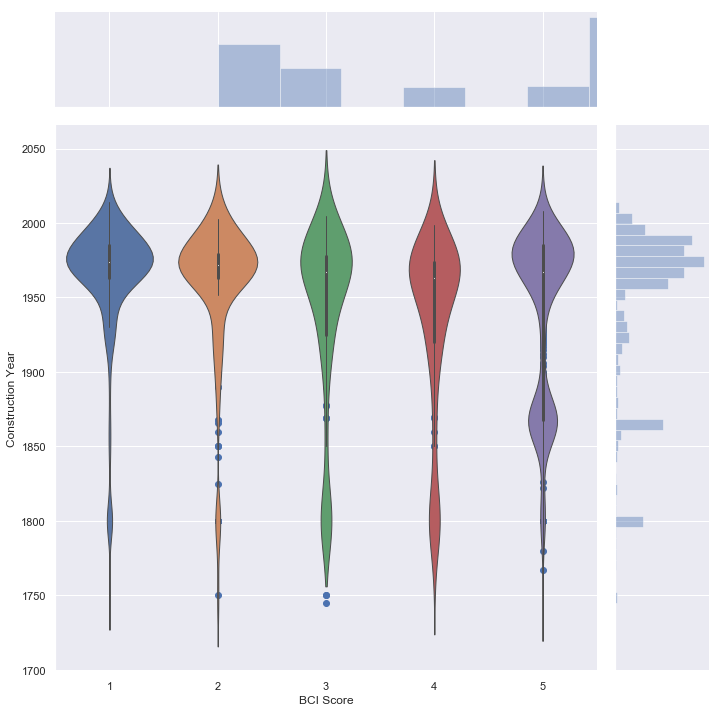

In [65]:
ax = sns.jointplot(x='BCI Score', y='Construction Year', data=Merged, height=10)
# ax = sns.pairplot(Merged[['BCI Score', 'Construction Year']], height=5)
ax.plot_joint(sns.violinplot, c="w", s=30, linewidth=1, marker="+")

In [272]:
Merged['Construction Year'] = pd.to_datetime(Merged['Construction Year'])

In [277]:
data = []
for i in range(0,len(pd.unique(Merged['BCI Score']))):
    trace = {
            "type": 'violin',
            "x": Merged['BCI Score'][Merged['BCI Score'] == pd.unique(Merged['BCI Score'])[i]],
            "y": Merged['Construction Year'][Merged['BCI Score'] == pd.unique(Merged['BCI Score'])[i]],
            "name": str(pd.unique(Merged['BCI Score'])[i]),
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "Structures construction year against BCI score",
        "yaxis": {
            "zeroline": False,
        }
    }
}

iplot(fig)
plot(fig, filename='plt_violins BCI.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_violins BCI.html'

In [274]:
Merged.columns

Index(['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
       'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
       'length', 'Carries', 'Crosses', 'Material', 'HCC Assessment Required?',
       'Historic Capacity', 'Assessment Found?', 'Assessment Date',
       'Length Score', 'Crosses Score', 'Carries Score', 'Route Score',
       'BCI Score', 'Year', 'Material Score', 'Importance', 'Severity',
       'Critical', 'Total Score', 'Radius', 'Latitude', 'Longitude'],
      dtype='object')

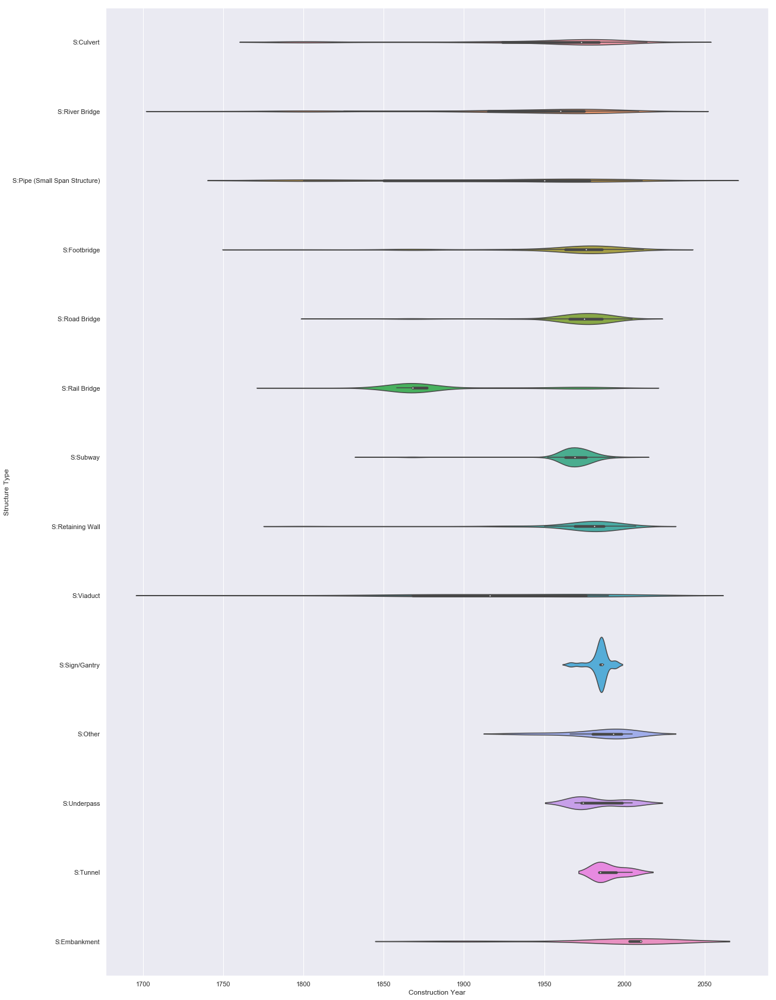

In [130]:
plt.rcParams['figure.figsize'] = [20, 30]
sns.violinplot(x='Construction Year', y='Structure Type', data=Merged)

In [278]:
data = []
for i in range(0,len(pd.unique(Merged['Structure Type']))):
    trace = {
            "type": 'violin',
            "x": Merged['Structure Type'][Merged['Structure Type'] == pd.unique(Merged['Structure Type'])[i]],
            "y": Merged['Construction Year'][Merged['Structure Type'] == pd.unique(Merged['Structure Type'])[i]],
            "name": str(pd.unique(Merged['Structure Type'])[i]),
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "Structures construction year against structure type",
        "yaxis": {
            "zeroline": False,
        }
    }
}

iplot(fig)
plot(fig, filename='plt_violins struc type.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_violins struc type.html'

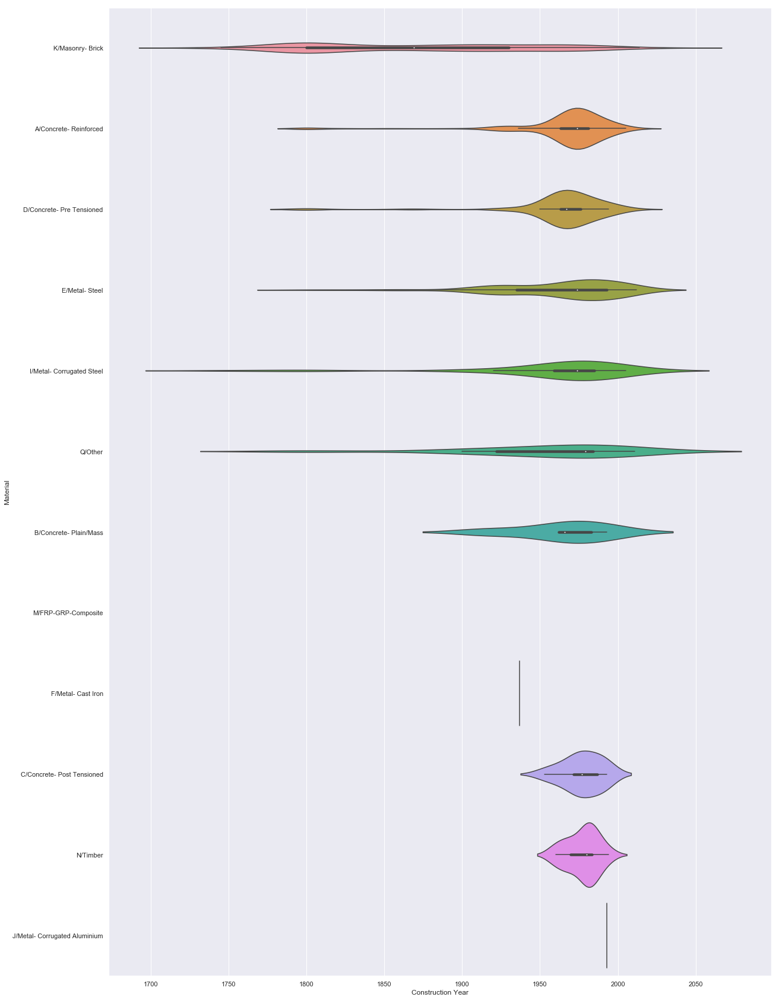

In [140]:
sns.violinplot(x='Construction Year', y='Material', data=Merged)

In [279]:
data = []
for i in range(0,len(pd.unique(Merged['Material']))):
    trace = {
            "type": 'violin',
            "x": Merged['Material'][Merged['Material'] == pd.unique(Merged['Material'])[i]],
            "y": Merged['Construction Year'][Merged['Material'] == pd.unique(Merged['Material'])[i]],
            "name": str(pd.unique(Merged['Material'])[i]),
            "box": {
                "visible": True
            },
            "meanline": {
                "visible": True
            }
        }
    data.append(trace)

        
fig = {
    "data": data,
    "layout" : {
        "title": "Structures construction year against primary material",
        "yaxis": {
            "zeroline": False,
        }
    }
}

iplot(fig)
plot(fig, filename='plt_violins material.html')

'file://C:\\Users\\lnath0\\OneDrive - WSP O365\\Code\\Pandas\\plt_violins material.html'

## Create a new dataset sorted by priority score

In [46]:
DF_Sorted = Merged.sort_values(by=['Total Score'])

In [47]:
DF_Sorted[-5:]

,feature_id,Name,Structure Type,Status,Easting,Northing,Maintaining Agent,Construction Year,Hertitage,critical_bci,...,BCI Score,Year,Material Score,Importance,Severity,Critical,Total Score,Radius,Latitude,Longitude
712,ST0736,HUNTERS BRIDGE,S:Rail Bridge,Live,524030.0,213116.0,HERTFORDSHIRE (STR),01/01/1961,Not Present,58.00,...,4,1961.0,5,15,20,False,300,680.947502,6.764572e+06,-22552.033814
1961,ST1953,RIVER LEA VIADUCT,S:Viaduct,Live,538469.0,210977.0,HERTFORDSHIRE (STR),01/01/1987,Not Present,58.00,...,4,1987.0,4,20,16,True,320,994.427191,6.760504e+06,649.779816
840,ST0864,WALTHAM CROSS ROAD RLY,S:Rail Bridge,Live,536523.0,200373.0,HERTFORDSHIRE (STR),01/01/1981,Not Present,0.00,...,5,1981.0,5,15,25,False,375,680.947502,6.743463e+06,-2950.986685
790,ST0819,20th MILE SOUTH BRIDGE,S:Rail Bridge,Live,523722.0,212079.0,HERTFORDSHIRE (STR),01/01/1968,Not Present,58.00,...,4,1968.0,5,20,20,True,400,994.427191,6.762907e+06,-23090.176316
1485,ST1469,KINGSMEAD VIADUCT,S:Viaduct,Live,534746.0,213512.0,HERTFORDSHIRE (STR),01/01/1975,Not Present,55.48,...,4,1975.0,4,25,16,True,400,1350.000000,6.764767e+06,-5244.625333


# Bokeh testing

In [48]:
import holoviews as hv
from bokeh.plotting import figure, output_file, show
from bokeh.models.glyphs import Rect
from bokeh.io import output_notebook
from bokeh.models import HoverTool, Panel, Legend
from bokeh.models import ColumnDataSource, CDSView, BooleanFilter
from bokeh.models import LinearColorMapper, ColorBar, BasicTicker, PrintfTickFormatter, CustomJS, CategoricalColorMapper
from bokeh.models.widgets import CheckboxGroup, CheckboxButtonGroup, Slider, Tabs, TextInput
from bokeh.models.widgets import Button, RangeSlider, Dropdown, DataTable, TableColumn
from bokeh.layouts import column, row, WidgetBox
from bokeh.models import Title
from bokeh.layouts import gridplot
from bokeh.tile_providers import CARTODBPOSITRON_RETINA, STAMEN_TERRAIN, CARTODBPOSITRON
import matplotlib as mpl
from collections import OrderedDict
from bokeh.io import curdoc
from bokeh.palettes import Category20

from bokeh.application.handlers import FunctionHandler
from bokeh.application import Application
output_notebook()

Loading BokehJS ...

In [42]:
from bokeh.plotting import figure, show, output_file
from bokeh.tile_providers import CARTODBPOSITRON

output_file("tile.html")

# range bounds supplied in web mercator coordinates
p = figure(x_range=(-2000000, 6000000), y_range=(-1000000, 7000000),
           x_axis_type="mercator", y_axis_type="mercator")
p.add_tile(STAMEN_TERRAIN)

show(p)

In [50]:
from bokeh.models import WMTSTileSource

## Non-critical bridges

In [35]:
# prepare some data

x = Merged['Easting'].values
y = Merged['Northing'].values
axis_range = x.max()-x.min()
half_range = axis_range/2
y_mid = y.max() - (y.max()-y.min())/2
radii = Importance**2
color_list = [i for i in range(1, 101)]
colors = [
    "#%02x%02x%02x" % (int(r), int(g), int(b)) for r, g, b, _ in 255*mpl.cm.jet(mpl.colors.Normalize()(color_list))
]
map = {i:clr for i, clr in enumerate(colors)}


TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

source = ColumnDataSource(Merged[Merged['Importance'] < 20])
# source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
# s2 = ColumnDataSource(data={key: [] for key in Merged.keys()})

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below')

# p.add_tile(STAMEN_TERRAIN)

mapper = LinearColorMapper(palette=colors, low=1, high=400)

# add a circle renderer with vectorized colors and sizes
p.circle('Easting', 'Northing', source=source, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

# p_filtered = figure(tools=TOOLS, x_range=p.x_range, y_range=p.y_range, toolbar_location='below')
# p_filtered.circle('Easting', 'Northing', source=source2, radius='Radius', hover_color='red',
#          fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p.title.text = "Non-critical bridges"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"



p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

# p_filtered.title.text = "Critical Bridges"
# p_filtered.title.align = "center"
# p_filtered.title.text_color = "black"
# p_filtered.title.text_font_size = "25px"

# p_filtered.axis.major_tick_line_color = None
# p_filtered.axis.major_label_text_font_size = "0pt"
# p_filtered.axis.major_label_standoff = 0



TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])


color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                     ticker=BasicTicker(desired_num_ticks=int(len(colors)/5)),
                     label_standoff=6, border_line_color=None, location=(0, 0))


p.add_layout(color_bar, 'right')
# p_filtered.add_layout(color_bar2, 'right')

def radius_callback(source=source, window=None):
    f=cb_obj.value
    data = source.data
    Imp = data['Importance']
    rad = data['Radius']
    for i in range(len(rad)):
        rad[i] = f*Imp[i]**1.5+100
    source.change.emit()

# Slider to select the radius scaler, value is selected number
radius_select = Slider(start = 0, end = 10, 
                     step = 0.1, value = 1,
                     title = 'Radius scaler',
                       callback=CustomJS.from_py_func(radius_callback))



# Update the plot when the value is changed
# radius_select.on_change('value', update)

# def callback(source=source):
#     data = source.data
#     f = cb_obj.active
#     struc = data['Structure Type']
#     imp = data['Importance']
#     for i in range(len(imp)):
#         if struc[i] in f:
#             data['Importance'] = 0
#             data['Radius'] = 0
#     source.change.emit()

# struc_selection = CheckboxGroup(labels=list(Merged['Structure Type'].unique()),
#                                 active=[i for i in range(len(Merged['Structure Type'].unique()))], callback=CustomJS.from_py_func(struc_callback))


# struc_selection.on_change('active', struc_callback)

# def struc_callback(source=source, window=None):
#     act = [cb_obj.labels[i] for i in cb_obj.active]
#     data = source.data
#     Imp = data['Importance']
#     rad = data['Radius']
#     for i in range(len(rad)):
#         rad[i] = f*Imp[i]**2+100
#     source.change.emit()

# crit_select = Button(
#         label="Critical", button_type="success", callback=CustomJS.from_py_func(crit_callback))

# crit_select.js_on_click(crit_callback)

# crit_callback = CustomJS(args=dict(s2=s2), code="""
#         var inds = cb_obj.selected.indices;
#         var d1 = cb_obj.data;
#         var d2 = s2.data;
#         d2['x'] = []
#         d2['y'] = []
#         for (var i = 0; i < inds.length; i++) {
#             d2['x'].push(d1['x'][inds[i]])
#             d2['y'].push(d1['y'][inds[i]])
#         }
#         s2.change.emit();
#     """)

# crit_select.on_change('active', update)

# Put controls in a single element
controls = WidgetBox(radius_select)

# Create a row layout

layout = row(controls, p)

# tab1 = Panel(child=layout1, title="Non-Critical")

# tab2 = Panel(child=layout2, title="Critical")

# tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridges non crit.html")

# show the results
# show(gridplot([[p, p_filtered]]))
show(layout)

## Range of importance

In [51]:
# prepare some data

x = Merged['Easting'].values
y = Merged['Northing'].values
axis_range = x.max()-x.min()
half_range = axis_range/2
y_mid = y.max() - (y.max()-y.min())/2
radii = Importance**2
color_list = [i for i in range(1, 101)]
colors = [
    "#%02x%02x%02x" % (int(r), int(g), int(b)) for r, g, b, _ in 255*mpl.cm.jet(mpl.colors.Normalize()(color_list))
]
map = {i:clr for i, clr in enumerate(colors)}


TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

source = ColumnDataSource(DF_Sorted)
# source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
s2 = ColumnDataSource(DF_Sorted)

s3 = ColumnDataSource({'x': [], 'y': [], 'width': [], 'height': []})

jscode="""
    var data = source.data;
    var start = cb_obj.start;
    var end = cb_obj.end;
    data['%s'] = [start + (end - start) / 2];
    data['%s'] = [end - start];
    source.change.emit();
"""

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below')

# p.add_tile(STAMEN_TERRAIN)

mapper = LinearColorMapper(palette=colors, low=1, high=400)

# add a circle renderer with vectorized colors and sizes
p.circle('Easting', 'Northing', source=s2, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)


p.title.text = "HCC bridges"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"

p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

p.add_layout(Title(text="Colour Bar = Priority Score", align="center"), "right")

p.x_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('x', 'width'))
p.y_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('y', 'height'))

# create a new plot with the tools above, and explicit ranges
p2 = figure(tools='', x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below')

# add a circle renderer with vectorized colors and sizes
p2.circle('Easting', 'Northing', source=source, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)

# p_filtered = figure(tools=TOOLS, x_range=p.x_range, y_range=p.y_range, toolbar_location='below')
# p_filtered.circle('Easting', 'Northing', source=source2, radius='Radius', hover_color='red',
#          fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p2.title.text = "See Zoom Window Here"
p2.title.align = "center"
p2.title.text_color = "black"
p2.title.text_font_size = "25px"

p2.axis.major_tick_line_color = None
p2.axis.major_label_text_font_size = "0pt"
p2.axis.major_label_standoff = 0

rect = Rect(x='x', y='y', width='width', height='height', fill_alpha=0.1,
            line_color='black', fill_color='black')

p2.add_glyph(s3, rect)

TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])


color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                     ticker=BasicTicker(desired_num_ticks=int(len(colors)/5)),
                     label_standoff=6, border_line_color=None, location=(0, 0))



p.add_layout(color_bar, 'right')
# p_filtered.add_layout(color_bar2, 'right')

def radius_callback(source=s2, window=None):
    f=cb_obj.value
    data = source.data
    Imp = data['Importance']
    rad = data['Radius']
    for i in range(len(rad)):
        rad[i] = f*Imp[i]**1.5+100
    source.change.emit()

# Slider to select the radius scaler, value is selected number
radius_select = Slider(start = 0, end = 20, 
                     step = 0.1, value = 10,
                     title = 'Radius scaler',
                       callback=CustomJS.from_py_func(radius_callback))

def range_callback(source=source, s2=s2, window=None):
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    data = source.data
    data2 = s2.data        
    range_start = int(cb_obj.value[0])
    range_end = int(cb_obj.value[1])
    assert range_end > range_start
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(range_start, range_end):
            data2[name].append(data[name][i])
    s2.change.emit()

selection = RangeSlider(start=1, end=2523, value=(1,2523), step=1, title="Structures",
                       callback=CustomJS.from_py_func(range_callback))



str0 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:River Bridge'])
str1 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Culvert'])
str2 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Subway'])
str3 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Footbridge'])
str4 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Retaining Wall'])
str5 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Pipe (Small Span Structure)'])
str6 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Sign/Gantry'])
str7 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Road Bridge'])
str8 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Viaduct'])
str9 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Underpass'])
str10 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Other'])
str11 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Embankment'])
str12 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Tunnel'])
str13 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Rail Bridge'])


def struc_callback(source=source, s2=s2, str0=str0, str1=str1, str3=str3, str4=str4,
                   str5=str5, str6=str6, str7=str7, str8=str8, str9=str9, str10=str10,
                   str11=str11, str12=str12, str13=str13, window=None):
    data = source.data
    data2 = s2.data
    length = len(data2['Structure Type'])
    value = cb_obj.value
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(length):
            if value == 'S:River Bridge':
                data2[name] = str0.data[name]
            if value == 'S:Culvert':
                data2[name] = str1.data[name]
            if value == 'S:Subway':
                data2[name] = str2.data[name]
            if value == 'S:Footbridge':
                data2[name] = str3.data[name]
            if value == 'S:Retaining Wall':
                data2[name] = str4.data[name]
            if value == 'S:Pipe (Small Span Structure)':
                data2[name] = str5.data[name]
            if value == 'S:Sign/Gantry':
                data2[name] = str6.data[name]
            if value == 'S:Road Bridge':
                data2[name] = str7.data[name]
            if value == 'S:Viaduct':
                data2[name] = str8.data[name]
            if value == 'S:Underpass':
                data2[name] = str9.data[name]
            if value == 'S:Other':
                data2[name] = str10.data[name]
            if value == 'S:Embankment':
                data2[name] = str11.data[name]
            if value == 'S:Tunnel':
                data2[name] = str12.data[name]
            if value == 'S:Rail Bridge':
                data2[name] = str13.data[name]
            if value == 'All':
                data2[name] = data[name]
    s2.change.emit()

menu = [(struc, struc) for struc in DF_Sorted['Structure Type'].unique()]
menu.append(('All', 'All'))

struc_labels =[struc for struc in DF_Sorted['Structure Type'].unique()]

dropdown = Dropdown(label='Structure Type', menu=menu, button_type="success", callback=CustomJS.from_py_func(struc_callback))      


wanted_columns = ['feature_id', 'Name', 'Structure Type', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance',
               'Total Score']
columns = [TableColumn(field=str(value), title=value) for value in wanted_columns]
data_table = DataTable(source=source, columns=columns, width=1200, height=1000)


# Put controls in a single element
controls = WidgetBox(radius_select, selection, dropdown)

# Create a row layout

layout = row(controls, p, p2)

tab1 = Panel(child=layout, title="Plots")

tab2 = Panel(child=data_table, title="Data")

tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridges Plot - NR.html")

# show the results
# show(gridplot([[p, p_filtered]]))
show(tabs)

## Plot with Mercator projection and map background

In [52]:
# prepare some data

x = DF_Sorted['Longitude'].values
y = DF_Sorted['Latitude'].values
axis_range = x.max()-x.min()
half_range = axis_range/2
y_mid = y.max() - (y.max()-y.min())/2
radii = Importance**2
color_list = [i for i in range(1, 101)]
colors = [
    "#%02x%02x%02x" % (int(r), int(g), int(b)) for r, g, b, _ in 255*mpl.cm.jet(mpl.colors.Normalize()(color_list))
]
map = {i:clr for i, clr in enumerate(colors)}


TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

source = ColumnDataSource(DF_Sorted)
# source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
s2 = ColumnDataSource(DF_Sorted)

s3 = ColumnDataSource({'x': [], 'y': [], 'width': [], 'height': []})

jscode="""
    var data = source.data;
    var start = cb_obj.start;
    var end = cb_obj.end;
    data['%s'] = [start + (end - start) / 2];
    data['%s'] = [end - start];
    source.change.emit();
"""

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below',
          x_axis_type="mercator", y_axis_type="mercator")

p.add_tile(CARTODBPOSITRON_RETINA)

mapper = LinearColorMapper(palette=colors, low=1, high=400)

# add a circle renderer with vectorized colors and sizes
p.circle('Longitude', 'Latitude', source=s2, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)


p.title.text = "HCC bridges"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"

p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

p.add_layout(Title(text="Colour Bar = Priority Score", align="center"), "right")

p.x_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('x', 'width'))
p.y_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('y', 'height'))

# create a new plot with the tools above, and explicit ranges
p2 = figure(tools='', x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below',
           x_axis_type="mercator", y_axis_type="mercator")

p2.add_tile(CARTODBPOSITRON_RETINA)

# add a circle renderer with vectorized colors and sizes
p2.circle('Longitude', 'Latitude', source=source, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)

# p_filtered = figure(tools=TOOLS, x_range=p.x_range, y_range=p.y_range, toolbar_location='below')
# p_filtered.circle('Easting', 'Northing', source=source2, radius='Radius', hover_color='red',
#          fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p2.title.text = "See Zoom Window Here"
p2.title.align = "center"
p2.title.text_color = "black"
p2.title.text_font_size = "25px"

p2.axis.major_tick_line_color = None
p2.axis.major_label_text_font_size = "0pt"
p2.axis.major_label_standoff = 0

rect = Rect(x='x', y='y', width='width', height='height', fill_alpha=0.1,
            line_color='black', fill_color='black')

p2.add_glyph(s3, rect)

TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])


color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                     ticker=BasicTicker(desired_num_ticks=int(len(colors)/5)),
                     label_standoff=6, border_line_color=None, location=(0, 0))



p.add_layout(color_bar, 'right')
# p_filtered.add_layout(color_bar2, 'right')

def radius_callback(source=s2, window=None):
    f=cb_obj.value
    data = source.data
    Imp = data['Importance']
    rad = data['Radius']
    for i in range(len(rad)):
        rad[i] = f*Imp[i]**1.5+100
    source.change.emit()

# Slider to select the radius scaler, value is selected number
radius_select = Slider(start = 0, end = 30, 
                     step = 0.1, value = 10,
                     title = 'Radius scaler',
                       callback=CustomJS.from_py_func(radius_callback))

def range_callback(source=source, s2=s2, window=None):
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    data = source.data
    data2 = s2.data        
    range_start = int(cb_obj.value[0])
    range_end = int(cb_obj.value[1])
    assert range_end > range_start
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(range_start, range_end):
            data2[name].append(data[name][i])
    s2.change.emit()

selection = RangeSlider(start=1, end=2523, value=(1,2523), step=1, title="Structures",
                       callback=CustomJS.from_py_func(range_callback))



str0 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:River Bridge'])
str1 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Culvert'])
str2 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Subway'])
str3 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Footbridge'])
str4 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Retaining Wall'])
str5 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Pipe (Small Span Structure)'])
str6 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Sign/Gantry'])
str7 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Road Bridge'])
str8 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Viaduct'])
str9 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Underpass'])
str10 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Other'])
str11 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Embankment'])
str12 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Tunnel'])
str13 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Rail Bridge'])


def struc_callback(source=source, s2=s2, str0=str0, str1=str1, str3=str3, str4=str4,
                   str5=str5, str6=str6, str7=str7, str8=str8, str9=str9, str10=str10,
                   str11=str11, str12=str12, str13=str13, window=None):
    data = source.data
    data2 = s2.data
    length = len(data2['Structure Type'])
    value = cb_obj.value
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(length):
            if value == 'S:River Bridge':
                data2[name] = str0.data[name]
            if value == 'S:Culvert':
                data2[name] = str1.data[name]
            if value == 'S:Subway':
                data2[name] = str2.data[name]
            if value == 'S:Footbridge':
                data2[name] = str3.data[name]
            if value == 'S:Retaining Wall':
                data2[name] = str4.data[name]
            if value == 'S:Pipe (Small Span Structure)':
                data2[name] = str5.data[name]
            if value == 'S:Sign/Gantry':
                data2[name] = str6.data[name]
            if value == 'S:Road Bridge':
                data2[name] = str7.data[name]
            if value == 'S:Viaduct':
                data2[name] = str8.data[name]
            if value == 'S:Underpass':
                data2[name] = str9.data[name]
            if value == 'S:Other':
                data2[name] = str10.data[name]
            if value == 'S:Embankment':
                data2[name] = str11.data[name]
            if value == 'S:Tunnel':
                data2[name] = str12.data[name]
            if value == 'S:Rail Bridge':
                data2[name] = str13.data[name]
            if value == 'All':
                data2[name] = data[name]
    s2.change.emit()

menu = [(struc, struc) for struc in DF_Sorted['Structure Type'].unique()]
menu.append(('All', 'All'))

struc_labels =[struc for struc in DF_Sorted['Structure Type'].unique()]

dropdown = Dropdown(label='Structure Type', menu=menu, button_type="success", callback=CustomJS.from_py_func(struc_callback))      


wanted_columns = ['feature_id', 'Name', 'Structure Type', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance',
               'Total Score']
columns = [TableColumn(field=str(value), title=value) for value in wanted_columns]
data_table = DataTable(source=source, columns=columns, width=1200, height=1000)


# Put controls in a single element
controls = WidgetBox(radius_select, selection, dropdown)

# Create a row layout

layout = row(controls, p, p2)

tab1 = Panel(child=layout, title="Plots")

tab2 = Panel(child=data_table, title="Data")

tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridges Plot NR.html", title='HCC Structures')

# show the results
# show(gridplot([[p, p_filtered]]))
show(tabs)

## Plot with Mercator projection and map background - CARTO

In [49]:
# prepare some data

x = DF_Sorted['Longitude'].values
y = DF_Sorted['Latitude'].values
axis_range = x.max()-x.min()
half_range = axis_range/2
y_mid = y.max() - (y.max()-y.min())/2
radii = Importance**2
color_list = [i for i in range(1, 101)]
colors = [
    "#%02x%02x%02x" % (int(r), int(g), int(b)) for r, g, b, _ in 255*mpl.cm.jet(mpl.colors.Normalize()(color_list))
]
map = {i:clr for i, clr in enumerate(colors)}


TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

source = ColumnDataSource(DF_Sorted)
# source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
s2 = ColumnDataSource(DF_Sorted)

s3 = ColumnDataSource({'x': [], 'y': [], 'width': [], 'height': []})

jscode="""
    var data = source.data;
    var start = cb_obj.start;
    var end = cb_obj.end;
    data['%s'] = [start + (end - start) / 2];
    data['%s'] = [end - start];
    source.change.emit();
"""

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below',
          x_axis_type="mercator", y_axis_type="mercator")

p.add_tile(CARTODBPOSITRON_RETINA)

mapper = LinearColorMapper(palette=colors, low=1, high=400)

# add a circle renderer with vectorized colors and sizes
p.circle('Longitude', 'Latitude', source=s2, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)


p.title.text = "HCC bridges"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"

p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

p.add_layout(Title(text="Colour Bar = Priority Score", align="center"), "right")

p.x_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('x', 'width'))
p.y_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('y', 'height'))

# create a new plot with the tools above, and explicit ranges
p2 = figure(tools='', x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below',
           x_axis_type="mercator", y_axis_type="mercator")

p2.add_tile(CARTODBPOSITRON)

# add a circle renderer with vectorized colors and sizes
p2.circle('Longitude', 'Latitude', source=source, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)

# p_filtered = figure(tools=TOOLS, x_range=p.x_range, y_range=p.y_range, toolbar_location='below')
# p_filtered.circle('Easting', 'Northing', source=source2, radius='Radius', hover_color='red',
#          fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p2.title.text = "See Zoom Window Here"
p2.title.align = "center"
p2.title.text_color = "black"
p2.title.text_font_size = "25px"

p2.axis.major_tick_line_color = None
p2.axis.major_label_text_font_size = "0pt"
p2.axis.major_label_standoff = 0

rect = Rect(x='x', y='y', width='width', height='height', fill_alpha=0.1,
            line_color='black', fill_color='black')

p2.add_glyph(s3, rect)

TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])


color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                     ticker=BasicTicker(desired_num_ticks=int(len(colors)/5)),
                     label_standoff=6, border_line_color=None, location=(0, 0))



p.add_layout(color_bar, 'right')
# p_filtered.add_layout(color_bar2, 'right')

def radius_callback(source=s2, window=None):
    f=cb_obj.value
    data = source.data
    Imp = data['Importance']
    rad = data['Radius']
    for i in range(len(rad)):
        rad[i] = f*Imp[i]**1.5+100
    source.change.emit()

# Slider to select the radius scaler, value is selected number
radius_select = Slider(start = 0, end = 30, 
                     step = 0.1, value = 10,
                     title = 'Radius scaler',
                       callback=CustomJS.from_py_func(radius_callback))

def range_callback(source=source, s2=s2, window=None):
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    data = source.data
    data2 = s2.data        
    range_start = int(cb_obj.value[0])
    range_end = int(cb_obj.value[1])
    assert range_end > range_start
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(range_start, range_end):
            data2[name].append(data[name][i])
    s2.change.emit()

selection = RangeSlider(start=1, end=2523, value=(1,2523), step=1, title="Structures",
                       callback=CustomJS.from_py_func(range_callback))



str0 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:River Bridge'])
str1 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Culvert'])
str2 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Subway'])
str3 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Footbridge'])
str4 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Retaining Wall'])
str5 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Pipe (Small Span Structure)'])
str6 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Sign/Gantry'])
str7 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Road Bridge'])
str8 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Viaduct'])
str9 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Underpass'])
str10 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Other'])
str11 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Embankment'])
str12 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Tunnel'])
str13 = ColumnDataSource(DF_Sorted[DF_Sorted['Structure Type'] == 'S:Rail Bridge'])


def struc_callback(source=source, s2=s2, str0=str0, str1=str1, str3=str3, str4=str4,
                   str5=str5, str6=str6, str7=str7, str8=str8, str9=str9, str10=str10,
                   str11=str11, str12=str12, str13=str13, window=None):
    data = source.data
    data2 = s2.data
    length = len(data2['Structure Type'])
    value = cb_obj.value
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(length):
            if value == 'S:River Bridge':
                data2[name] = str0.data[name]
            if value == 'S:Culvert':
                data2[name] = str1.data[name]
            if value == 'S:Subway':
                data2[name] = str2.data[name]
            if value == 'S:Footbridge':
                data2[name] = str3.data[name]
            if value == 'S:Retaining Wall':
                data2[name] = str4.data[name]
            if value == 'S:Pipe (Small Span Structure)':
                data2[name] = str5.data[name]
            if value == 'S:Sign/Gantry':
                data2[name] = str6.data[name]
            if value == 'S:Road Bridge':
                data2[name] = str7.data[name]
            if value == 'S:Viaduct':
                data2[name] = str8.data[name]
            if value == 'S:Underpass':
                data2[name] = str9.data[name]
            if value == 'S:Other':
                data2[name] = str10.data[name]
            if value == 'S:Embankment':
                data2[name] = str11.data[name]
            if value == 'S:Tunnel':
                data2[name] = str12.data[name]
            if value == 'S:Rail Bridge':
                data2[name] = str13.data[name]
            if value == 'All':
                data2[name] = data[name]
    s2.change.emit()

menu = [(struc, struc) for struc in DF_Sorted['Structure Type'].unique()]
menu.append(('All', 'All'))

struc_labels =[struc for struc in DF_Sorted['Structure Type'].unique()]

dropdown = Dropdown(label='Structure Type', menu=menu, button_type="success", callback=CustomJS.from_py_func(struc_callback))      


wanted_columns = ['feature_id', 'Name', 'Structure Type', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance',
               'Total Score']
columns = [TableColumn(field=str(value), title=value) for value in wanted_columns]
data_table = DataTable(source=source, columns=columns, width=1200, height=1000)


# Put controls in a single element
controls = WidgetBox(radius_select, selection, dropdown)

# Create a row layout

layout = row(controls, p, p2)

tab1 = Panel(child=layout, title="Plots")

tab2 = Panel(child=data_table, title="Data")

tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridges Plot - NR.html")

# show the results
# show(gridplot([[p, p_filtered]]))
show(tabs)

## Bridge Atlas

In [43]:
DF_Sorted['Radius'] = 100
DF_Sorted['Structure Type'].unique()

array(['S:River Bridge', 'S:Culvert', 'S:Subway', 'S:Footbridge',
       'S:Retaining Wall', 'S:Pipe (Small Span Structure)',
       'S:Sign/Gantry', 'S:Road Bridge', 'S:Viaduct', 'S:Underpass',
       'S:Other', 'S:Embankment', 'S:Tunnel', 'S:Rail Bridge'],
      dtype=object)

In [44]:
struc_frames = []
source_frames = []
sources = []

In [45]:
for i, struc in enumerate(DF_Sorted['Structure Type'].unique()):
    struc_frames.append(DF_Sorted[DF_Sorted['Structure Type'] == struc])

In [46]:
for i, src in enumerate(struc_frames):
    sources.append(ColumnDataSource(src))

In [47]:
# prepare some data

x = DF_Sorted['Longitude'].values
y = DF_Sorted['Latitude'].values
# radii = Importance**2
# color_list = [i for i in range(1, 101)]
colors = Category20[14]
# map = {i:clr for i, clr in enumerate(colors)}

circles = []

TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

# source = ColumnDataSource(DF_Sorted)
# source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
s2 = ColumnDataSource(DF_Sorted)

s3 = ColumnDataSource({'x': [], 'y': [], 'width': [], 'height': []})

jscode="""
    var data = source.data;
    var start = cb_obj.start;
    var end = cb_obj.end;
    data['%s'] = [start + (end - start) / 2];
    data['%s'] = [end - start];
    source.change.emit();
"""

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below',
          x_axis_type="mercator", y_axis_type="mercator")

p.add_tile(STAMEN_TERRAIN)

mapper = CategoricalColorMapper(palette=colors, factors=Struc_uniq)

for data, name, color in zip(sources, Struc_uniq, colors):
    circles.append(p.circle('Longitude', 'Latitude', radius='Radius', source=data, color=color, alpha=0.8, legend=name))

# # add a circle renderer with vectorized colors and sizes
# p.circle('Longitude', 'Latitude', source=s2, radius='Radius', hover_color='red',
#          fill_color={'field': 'Structure Type', 'transform': mapper}, fill_alpha=0.5, hover_alpha=0.8, line_color=None)


p.title.text = "HCC Bridge Atlas"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"



p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

p.x_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('x', 'width'))
p.y_range.callback = CustomJS(
        args=dict(source=s3), code=jscode % ('y', 'height'))

# create a new plot with the tools above, and explicit ranges
# p2 = figure(tools='', x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below',
#            x_axis_type="mercator", y_axis_type="mercator")

# p2.add_tile(STAMEN_TERRAIN)

# p2.title.text = "See Zoom Window Here"
# p2.title.align = "center"
# p2.title.text_color = "black"
# p2.title.text_font_size = "25px"

# p2.axis.major_tick_line_color = None
# p2.axis.major_label_text_font_size = "0pt"
# p2.axis.major_label_standoff = 0

# rect = Rect(x='x', y='y', width='width', height='height', fill_alpha=0.1,
#             line_color='black', fill_color='black')

# p2.add_glyph(s3, rect)

TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Northing", "@Northing"),
    ("Easting", "@Easting")])


legend = Legend(items=[
    (Struc_uniq[0]   , [circles[0]]),
    (Struc_uniq[1]   , [circles[1]]),
    (Struc_uniq[2]   , [circles[2]]),
    (Struc_uniq[3]   , [circles[3]]),
    (Struc_uniq[4]   , [circles[4]]),
    (Struc_uniq[5]   , [circles[5]]),
    (Struc_uniq[6]   , [circles[6]]),
    (Struc_uniq[7]   , [circles[7]]),
    (Struc_uniq[8]   , [circles[8]]),
    (Struc_uniq[9]   , [circles[9]]),
    (Struc_uniq[10]   , [circles[10]]),
    (Struc_uniq[11]   , [circles[11]]),
    (Struc_uniq[12]   , [circles[12]]),
    (Struc_uniq[13]   , [circles[13]])
], location=(0, 0))

p.legend.visible = not legend.visible

def struc_callback(source=source, s2=s2, str0=str0, str1=str1, str3=str3, str4=str4,
                   str5=str5, str6=str6, str7=str7, str8=str8, str9=str9, str10=str10,
                   str11=str11, str12=str12, str13=str13, window=None):
    data = source.data
    data2 = s2.data
    length = len(data2['Structure Type'])
    value = cb_obj.value
    columns = ['feature_id', 'Name', 'Structure Type', 'Status', 'Easting', 'Northing',
               'Maintaining Agent', 'Construction Year', 'Hertitage', 'critical_bci',
               'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
               'Carries Score', 'Route Score', 'BCI Score', 'Importance', 'Severity',
               'Total Score', 'Latitude', 'Longitude', 'Critical', 'Radius']
    for name in columns:
        data2[name] = []
    for name in columns:
        for i in range(length):
            if value == 'S:River Bridge':
                data2[name] = str0.data[name]
            if value == 'S:Culvert':
                data2[name] = str1.data[name]
            if value == 'S:Subway':
                data2[name] = str2.data[name]
            if value == 'S:Footbridge':
                data2[name] = str3.data[name]
            if value == 'S:Retaining Wall':
                data2[name] = str4.data[name]
            if value == 'S:Pipe (Small Span Structure)':
                data2[name] = str5.data[name]
            if value == 'S:Sign/Gantry':
                data2[name] = str6.data[name]
            if value == 'S:Road Bridge':
                data2[name] = str7.data[name]
            if value == 'S:Viaduct':
                data2[name] = str8.data[name]
            if value == 'S:Underpass':
                data2[name] = str9.data[name]
            if value == 'S:Other':
                data2[name] = str10.data[name]
            if value == 'S:Embankment':
                data2[name] = str11.data[name]
            if value == 'S:Tunnel':
                data2[name] = str12.data[name]
            if value == 'S:Rail Bridge':
                data2[name] = str13.data[name]
            if value == 'All':
                data2[name] = data[name]
    s2.change.emit()

menu = [(struc, struc) for struc in DF_Sorted['Structure Type'].unique()]
menu.append(('All', 'All'))

struc_labels =[struc for struc in DF_Sorted['Structure Type'].unique()]

dropdown = Dropdown(label='Structure Type', menu=menu, button_type="success", callback=CustomJS.from_py_func(struc_callback))      

struc_selection = CheckboxGroup(labels=list(Merged['Structure Type'].unique()),
                                active=[i for i in range(len(Struc_uniq))], callback=CustomJS.from_py_func(struc_callback))



# p.legend.location = "top_left"
# p.legend.click_policy="hide"
# p.legend.orientation = "horizontal"
   


# wanted_columns = ['feature_id', 'Name', 'Structure Type', 'critical_bci',
#                'length', 'Carries', 'Crosses', 'Length Score', 'Crosses Score',
#                'Carries Score', 'Route Score', 'BCI Score', 'Importance',
#                'Total Score']
# columns = [TableColumn(field=str(value), title=value) for value in wanted_columns]
# data_table = DataTable(source=source, columns=columns, width=1200, height=1000)


# # Put controls in a single element
# controls = WidgetBox(radius_select)

# # Create a row layout
# p2.add_layout(legend, 'right')

# p.legend.__setattr__('label_text_font_size', "5pt")
# p.legend.__setattr__('glyph_height', 10)
# p.legend.__setattr__('glyph_width', 10)
# p.legend.__setattr__('label_height', 10)
# p.legend.__setattr__('label_width', 20)

controls = WidgetBox(radius_select)

layout = row(p, p2)

# tab1 = Panel(child=layout, title="Plots")

# tab2 = Panel(child=data_table, title="Data")

# tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridge Atlas.html")

# show the results
# show(gridplot([[p, p_filtered]]))

show(layout)

IndexError: list index out of range

In [38]:
DF_Sorted['Structure Type'].unique()

array(['S:River Bridge', 'S:Culvert', 'S:Subway', 'S:Footbridge',
       'S:Retaining Wall', 'S:Pipe (Small Span Structure)',
       'S:Sign/Gantry', 'S:Road Bridge', 'S:Viaduct', 'S:Underpass',
       'S:Other', 'S:Embankment', 'S:Tunnel', 'S:Rail Bridge'],
      dtype=object)

In [46]:
# prepare some data

x = Merged['Easting'].values
y = Merged['Northing'].values
axis_range = x.max()-x.min()
half_range = axis_range/2
y_mid = y.max() - (y.max()-y.min())/2
radii = Importance**2
color_list = [i for i in range(1, 101)]
colors = [
    "#%02x%02x%02x" % (int(r), int(g), int(b)) for r, g, b, _ in 255*mpl.cm.jet(mpl.colors.Normalize()(color_list))
]
map = {i:clr for i, clr in enumerate(colors)}


TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

source = ColumnDataSource(Merged[Merged['Importance'] >= 20])
# source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
# s2 = ColumnDataSource(data={key: [] for key in Merged.keys()})

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below')

# p.add_tile(STAMEN_TERRAIN)

mapper = LinearColorMapper(palette=colors, low=1, high=100)

# add a circle renderer with vectorized colors and sizes
p.circle('Easting', 'Northing', source=source, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

# p_filtered = figure(tools=TOOLS, x_range=p.x_range, y_range=p.y_range, toolbar_location='below')
# p_filtered.circle('Easting', 'Northing', source=source2, radius='Radius', hover_color='red',
#          fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p.title.text = "Non-critical bridges"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"



p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

# p_filtered.title.text = "Critical Bridges"
# p_filtered.title.align = "center"
# p_filtered.title.text_color = "black"
# p_filtered.title.text_font_size = "25px"

# p_filtered.axis.major_tick_line_color = None
# p_filtered.axis.major_label_text_font_size = "0pt"
# p_filtered.axis.major_label_standoff = 0



TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])


color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                     ticker=BasicTicker(desired_num_ticks=int(len(colors)/5)),
                     label_standoff=6, border_line_color=None, location=(0, 0))



p.add_layout(color_bar, 'right')
# p_filtered.add_layout(color_bar2, 'right')

def radius_callback(source=source, window=None):
    f=cb_obj.value
    data = source.data
    Imp = data['Importance']
    rad = data['Radius']
    for i in range(len(rad)):
        rad[i] = f*Imp[i]**1.5+50
    source.change.emit()

# Slider to select the radius scaler, value is selected number
radius_select = Slider(start = 0, end = 10, 
                     step = 0.1, value = 1,
                     title = 'Radius scaler',
                       callback=CustomJS.from_py_func(radius_callback))


# Update the plot when the value is changed
# radius_select.on_change('value', update)

# def callback(source=source):
#     data = source.data
#     f = cb_obj.active
#     struc = data['Structure Type']
#     imp = data['Importance']
#     for i in range(len(imp)):
#         if struc[i] in f:
#             data['Importance'] = 0
#             data['Radius'] = 0
#     source.change.emit()

# struc_selection = CheckboxGroup(labels=list(Merged['Structure Type'].unique()),
#                                 active=[i for i in range(len(Merged['Structure Type'].unique()))], callback=CustomJS.from_py_func(struc_callback))


# struc_selection.on_change('active', struc_callback)

# def struc_callback(source=source, window=None):
#     act = [cb_obj.labels[i] for i in cb_obj.active]
#     data = source.data
#     Imp = data['Importance']
#     rad = data['Radius']
#     for i in range(len(rad)):
#         rad[i] = f*Imp[i]**2+100
#     source.change.emit()

# crit_select = Button(
#         label="Critical", button_type="success", callback=CustomJS.from_py_func(crit_callback))

# crit_select.js_on_click(crit_callback)

# crit_callback = CustomJS(args=dict(s2=s2), code="""
#         var inds = cb_obj.selected.indices;
#         var d1 = cb_obj.data;
#         var d2 = s2.data;
#         d2['x'] = []
#         d2['y'] = []
#         for (var i = 0; i < inds.length; i++) {
#             d2['x'].push(d1['x'][inds[i]])
#             d2['y'].push(d1['y'][inds[i]])
#         }
#         s2.change.emit();
#     """)

# crit_select.on_change('active', update)

# Put controls in a single element
controls = WidgetBox(radius_select)

# Create a row layout

layout = row(controls, p)

# tab1 = Panel(child=layout1, title="Non-Critical")

# tab2 = Panel(child=layout2, title="Critical")

# tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridges Critical.html")

# show the results
# show(gridplot([[p, p_filtered]]))
show(layout)

In [37]:
# prepare some data

x = Merged['Easting'].values
y = Merged['Northing'].values
radii = Importance**2+50
color_list = [i for i in range(1, 101)]
colors = [
    "#%02x%02x%02x" % (int(r), int(g), int(b)) for r, g, b, _ in 255*mpl.cm.jet(mpl.colors.Normalize()(color_list))
]
map = {i:clr for i, clr in enumerate(colors)}
# filter_color = []
# for i, bl in enumerate(Merged['Critical'].values):
#     if bl == True:
#         filter_color.append(colors[i])

# output to static HTML file (with CDN resources)
# output_file("color_scatter.html", title="color_scatter.py example", mode="cdn")

# hover = HoverTool(tooltips=[("Easting", "@x"), ("y", "@y")])

TOOLS = "crosshair,pan,wheel_zoom,box_zoom,reset,box_select,lasso_select,hover"

source = ColumnDataSource(Merged[Merged['Importance'] < 20])
source2 = ColumnDataSource(Merged[Merged['Importance'] >= 20])
s2 = ColumnDataSource(data={key: [] for key in Merged.keys()})

# create a new plot with the tools above, and explicit ranges
p = figure(tools=TOOLS, x_range=(x.min()-100, x.max()+100), y_range=(y.min()-100, y.max()+100), toolbar_location='below')

mapper = LinearColorMapper(palette=colors, low=1, high=100)

# add a circle renderer with vectorized colors and sizes
p.circle('Easting', 'Northing', source=source, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p_filtered = figure(tools=TOOLS, x_range=p.x_range, y_range=p.y_range)
p_filtered.circle('Easting', 'Northing', source=source2, radius='Radius', hover_color='red',
         fill_color={'field': 'Total Score', 'transform': mapper}, fill_alpha=0.3, hover_alpha=0.8, line_color=None)

p.title.text = "Non-critical bridges"
p.title.align = "center"
p.title.text_color = "black"
p.title.text_font_size = "25px"

tab1 = Panel(child=p, title="circle")

p.axis.major_tick_line_color = None
p.axis.major_label_text_font_size = "0pt"
p.axis.major_label_standoff = 0

p_filtered.title.text = "Critical Bridges"
p_filtered.title.align = "center"
p_filtered.title.text_color = "black"
p_filtered.title.text_font_size = "25px"

p_filtered.axis.major_tick_line_color = None
p_filtered.axis.major_label_text_font_size = "0pt"
p_filtered.axis.major_label_standoff = 0

tab2 = Panel(child=p_filtered, title="line")

TOOLS="crosshair,pan,wheel_zoom,box_zoom,reset,hover"

hover =p.select(dict(type=HoverTool))
hover.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])

hover2 =p_filtered.select(dict(type=HoverTool))
hover2.tooltips = OrderedDict([
    ("Struct ID", "@feature_id"),
    ("Name", "@Name"),
    ("Importance", "@Importance"),
    ("BCI", "@Severity")])

color_bar = ColorBar(color_mapper=mapper, major_label_text_font_size="5pt",
                     ticker=BasicTicker(desired_num_ticks=int(len(colors)/5)),
                     label_standoff=6, border_line_color=None, location=(0, 0))


p.add_layout(color_bar, 'right')

def radius_callback(source=source, window=None):
    f=cb_obj.value
    data = source.data
    Imp = data['Importance']
    rad = data['Radius']
    for i in range(len(rad)):
        rad[i] = f*Imp[i]**2+100
    source.change.emit()

# Slider to select the radius scaler, value is selected number
radius_select = Slider(start = 0, end = 10, 
                     step = 0.1, value = 1,
                     title = 'Radius scaler',
                       callback=CustomJS.from_py_func(radius_callback))


# Update the plot when the value is changed
# radius_select.on_change('value', update)

# def callback(source=source):
#     data = source.data
#     f = cb_obj.active
#     struc = data['Structure Type']
#     imp = data['Importance']
#     for i in range(len(imp)):
#         if struc[i] in f:
#             data['Importance'] = 0
#             data['Radius'] = 0
#     source.change.emit()

# struc_selection = CheckboxGroup(labels=list(Merged['Structure Type'].unique()),
#                                 active=[i for i in range(len(Merged['Structure Type'].unique()))], callback=CustomJS.from_py_func(struc_callback))


# struc_selection.on_change('active', struc_callback)

# def struc_callback(source=source, window=None):
#     act = [cb_obj.labels[i] for i in cb_obj.active]
#     data = source.data
#     Imp = data['Importance']
#     rad = data['Radius']
#     for i in range(len(rad)):
#         rad[i] = f*Imp[i]**2+100
#     source.change.emit()

# crit_select = Button(
#         label="Critical", button_type="success", callback=CustomJS.from_py_func(crit_callback))

# crit_select.js_on_click(crit_callback)

# crit_callback = CustomJS(args=dict(s2=s2), code="""
#         var inds = cb_obj.selected.indices;
#         var d1 = cb_obj.data;
#         var d2 = s2.data;
#         d2['x'] = []
#         d2['y'] = []
#         for (var i = 0; i < inds.length; i++) {
#             d2['x'].push(d1['x'][inds[i]])
#             d2['y'].push(d1['y'][inds[i]])
#         }
#         s2.change.emit();
#     """)

# crit_select.on_change('active', update)

# Put controls in a single element
controls = WidgetBox(radius_select)

# Create a row layout
layout = row(controls, p, p_filtered)

# tabs = Tabs(tabs=[ tab1, tab2 ])

output_file("HCC Bridges.html")

# show the results
# show(gridplot([[p, p_filtered]]))
show(tabs)